In [1]:
import pandas as pd

# load data as DataFrame
drink = pd.read_csv('/Users/jameshurst/Library/CloudStorage/SynologyDrive-james/Dropbox/Quant/AlgoJam2024/data/Fun Drink_price_history.csv')
drink

,Day,Price
0,0,8.00
1,1,8.19
2,2,7.74
3,3,7.55
4,4,8.31
...,...,...
360,360,8.17
361,361,8.94
362,362,8.63
363,363,7.71


In [2]:
# produce a 10 day ema for drinks
drink['EMA10'] = drink['Price'].ewm(span=10, adjust=False).mean()
drink['EMA5'] = drink['Price'].ewm(span=5, adjust=False).mean()
drink['EMA15'] = drink['Price'].ewm(span=15, adjust=False).mean()
drink['EMA20'] = drink['Price'].ewm(span=20, adjust=False).mean()
drink

,Day,Price,EMA10,EMA5,EMA15,EMA20
0,0,8.00,8.000000,8.000000,8.000000,8.000000
1,1,8.19,8.034545,8.063333,8.023750,8.018095
2,2,7.74,7.980992,7.955556,7.988281,7.991610
3,3,7.55,7.902630,7.820370,7.933496,7.949552
4,4,8.31,7.976697,7.983580,7.980559,7.983880
...,...,...,...,...,...,...
360,360,8.17,7.831273,7.854513,7.851340,7.880144
361,361,8.94,8.032860,8.216342,7.987423,7.981083
362,362,8.63,8.141431,8.354228,8.067745,8.042885
363,363,7.71,8.062989,8.139485,8.023027,8.011181


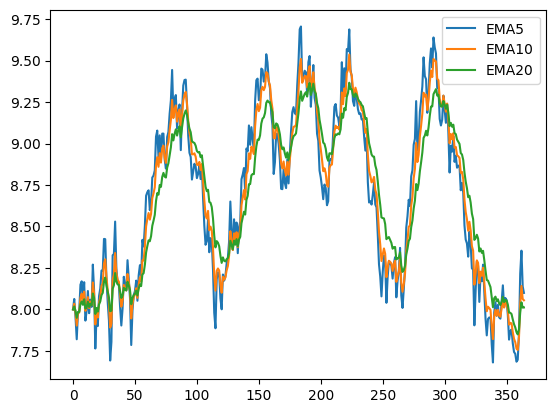

In [3]:
# plot data with EMA
import matplotlib.pyplot as plt
import numpy as np

plt.plot(drink['Day'], drink['EMA5'], label='EMA5')
plt.plot(drink['Day'], drink['EMA10'], label='EMA10')
plt.plot(drink['Day'], drink['EMA20'], label='EMA20')
plt.legend()
plt.show()


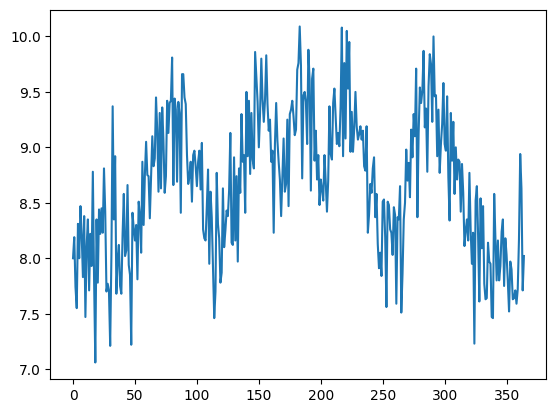

In [4]:
# plot price
plt.plot(drink['Day'], drink['Price'])

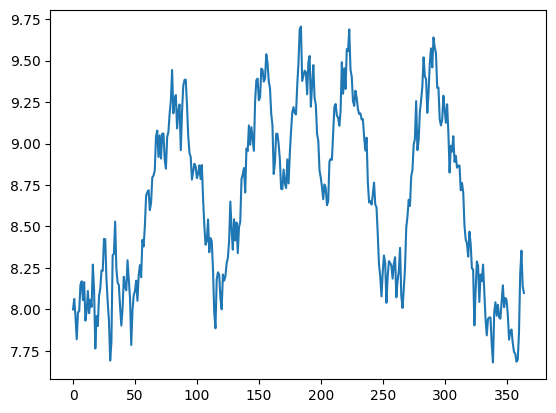

In [5]:
# plot EMA5
plt.plot(drink['Day'], drink['EMA5'])

(100.0, 200.0)

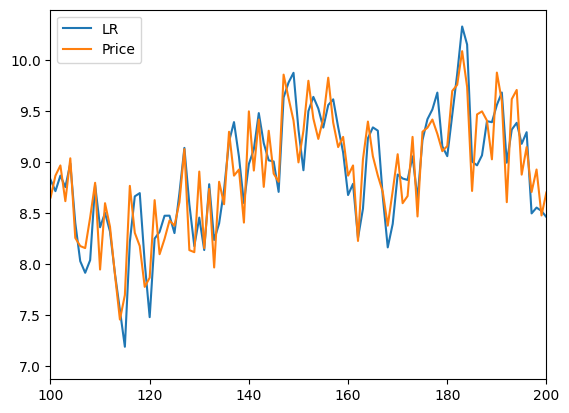

In [6]:
LR_length = 5
# create a column that is a linear regression of the last LR_length days
def linear_extrapolation(values, amt=LR_length):
    try:
        if len(values) < amt:
            return np.nan  # Not enough data to extrapolate
        x = np.arange(amt)
        y = values[-amt:]
        coeffs = np.polyfit(x, y, 1)  # Linear fit (degree 1)
        extrapolated_value = np.polyval(coeffs, amt)  # Extrapolate to the next point
        return extrapolated_value
    except TypeError:
        return np.nan

# Create the new column with extrapolated values
drink['LR'] = drink['Price'].rolling(window=LR_length).apply(linear_extrapolation, raw=True)

#plot it
plt.plot(drink['Day'], drink['LR'], label='LR')
plt.plot(drink['Day'], drink['Price'], label='Price')
plt.legend()
plt.xlim(100, 200)

In [7]:
drink

,Day,Price,EMA10,EMA5,EMA15,EMA20,LR
0,0,8.00,8.000000,8.000000,8.000000,8.000000,NaN
1,1,8.19,8.034545,8.063333,8.023750,8.018095,NaN
2,2,7.74,7.980992,7.955556,7.988281,7.991610,NaN
3,3,7.55,7.902630,7.820370,7.933496,7.949552,NaN
4,4,8.31,7.976697,7.983580,7.980559,7.983880,7.952
...,...,...,...,...,...,...,...
360,360,8.17,7.831273,7.854513,7.851340,7.880144,8.087
361,361,8.94,8.032860,8.216342,7.987423,7.981083,8.938
362,362,8.63,8.141431,8.354228,8.067745,8.042885,9.200
363,363,7.71,8.062989,8.139485,8.023027,8.011181,8.366


In [8]:
# find average of last 7 days
short = drink.loc[0:8]

drink['WeekAve'] = drink['Price'].rolling(window=7).mean()
drink['WeekVar'] = drink['Price'] - drink['WeekAve']

short['WeekAve'] = short['Price'].rolling(window=7).mean()
short['WeekVar'] = short['Price'] - short['WeekAve']

drink['DayOfWeek'] = drink['Day'] % 7
short['DayOfWeek'] = short['Day'] % 7
weekly = drink.groupby('DayOfWeek').mean()
short_weekly = short.groupby('DayOfWeek').mean()
weekly

/var/folders/2l/2bz89g8j7q126ptf5h5hjrn80000gn/T/ipykernel_94998/796569094.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short['WeekAve'] = short['Price'].rolling(window=7).mean()
/var/folders/2l/2bz89g8j7q126ptf5h5hjrn80000gn/T/ipykernel_94998/796569094.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short['WeekVar'] = short['Price'] - short['WeekAve']
/var/folders/2l/2bz89g8j7q126ptf5h5hjrn80000gn/T/ipykernel_94998/796569094.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy o

,Day,Price,EMA10,EMA5,EMA15,EMA20,LR,WeekAve,WeekVar
DayOfWeek,,,,,,,,,
0,182.0,8.667358,8.662756,8.664258,8.661771,8.661175,8.692462,8.671648,0.008544
1,179.5,8.644808,8.669052,8.665013,8.670405,8.670911,8.608471,8.680952,-0.027227
2,180.5,8.655577,8.666602,8.661868,8.668551,8.669450,8.657725,8.680896,-0.007367
3,181.5,8.574808,8.649912,8.632848,8.656833,8.660437,8.611843,8.682633,-0.087731
4,182.5,8.807500,8.678565,8.691065,8.675667,8.674443,8.728115,8.684398,0.132857
5,183.5,8.701154,8.682672,8.694428,8.678853,8.676987,8.756154,8.686162,0.028739
6,184.5,8.637500,8.674459,8.675452,8.673684,8.673226,8.702365,8.671593,-0.034093


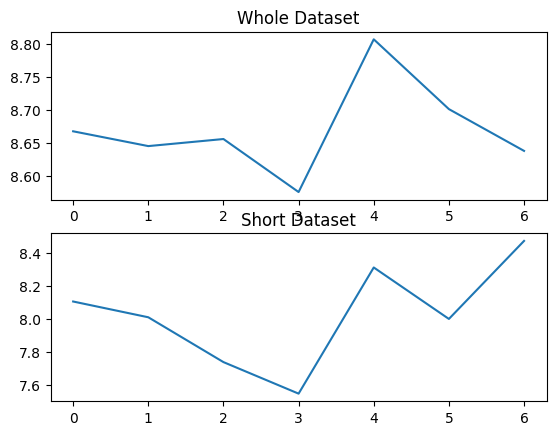

In [9]:
# plt.plot(weekly.index, weekly['Price'], label='Price')
# plt.xlabel('Day of Week')
# plt.ylabel('Price')
# plt.title('Average Price by Day of Week')

# do a subplot of weekly index and weekly price and short_weekly price
fig, ax = plt.subplots(2)
ax[0].plot(weekly.index, weekly['Price'], label='Price')
ax[0].set_title('Whole Dataset')
ax[1].plot(short_weekly.index, short_weekly['Price'], label='Short Price')
ax[1].set_title('Short Dataset')
plt.show()


Text(0.5, 1.0, 'Average Price by Day of Week')

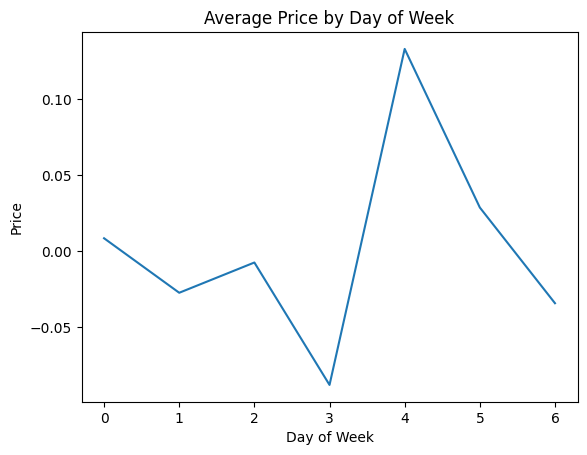

In [10]:
plt.plot(weekly.index, weekly['WeekVar'], label='Price')
plt.xlabel('Day of Week')
plt.ylabel('Price')
plt.title('Average Price by Day of Week')

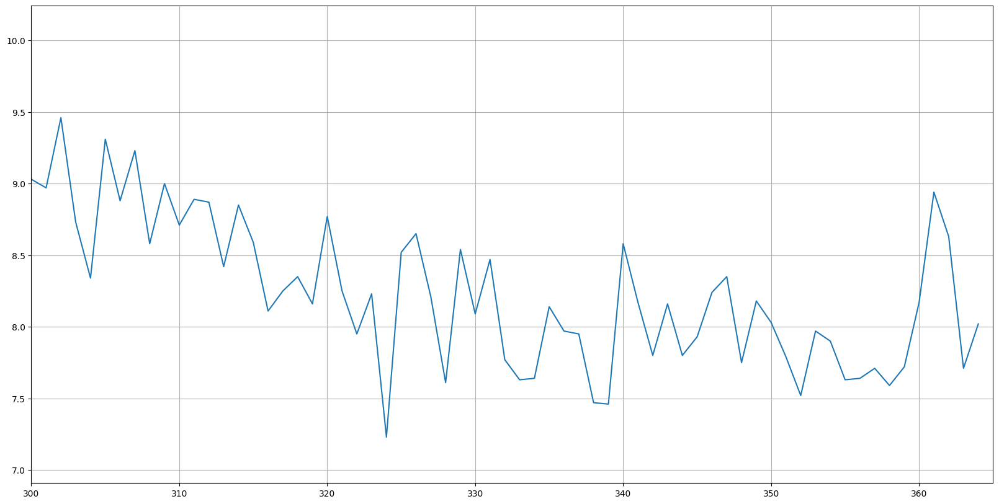

In [11]:
plt.figure(figsize=(20,10))
plt.plot(drink['Day'], drink['Price'])
plt.xlim(300, 365)
plt.grid()
# make plot bigger


The below is the profit from simply buying when day%7 = 3, and selling when day%7 = 4.

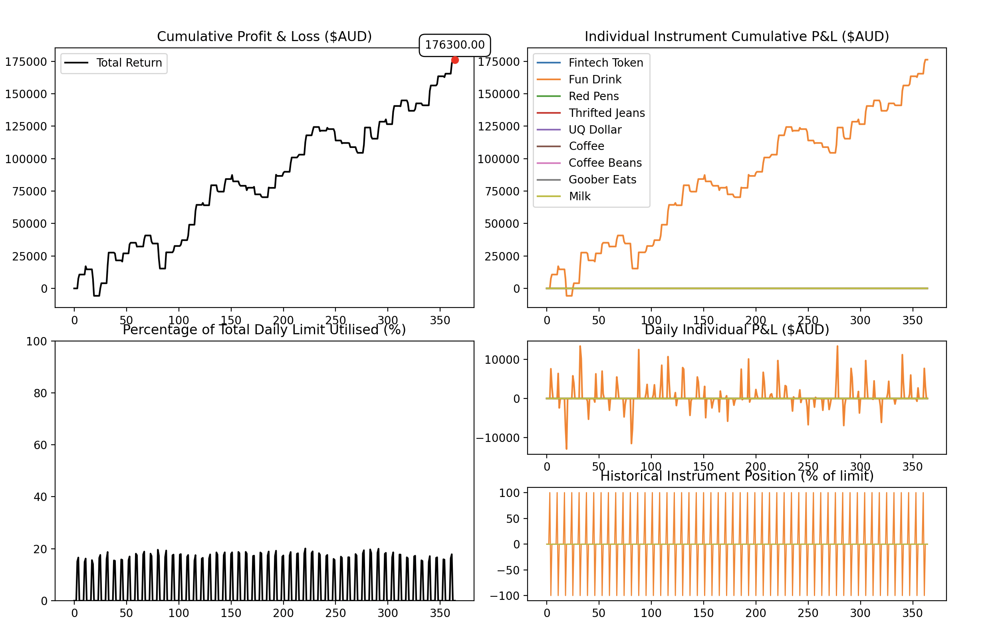

Now i am going to implement a simply EMA strategy.
For EMA 

span = 15, PNL = 812800
span = 14, PNL = 818600
span = 13, PNL = 811800
span = 12, PNL = 810000
span = 11, PNL = 808000.00
span = 10, PNL = 808000.00
span = 9, PNL = 800200
span = 8, PNL = 783600
span = 7, PNL = 783600
span = 6, PNL = 801200
span = 5, PNL = 835400
span = 4, PNL= 805800
span = 3, PNL = 808400
span = 2, PNL = 809000
span = 1, PNL = 200

The below is span = 5. The theoretical best of this strategy.
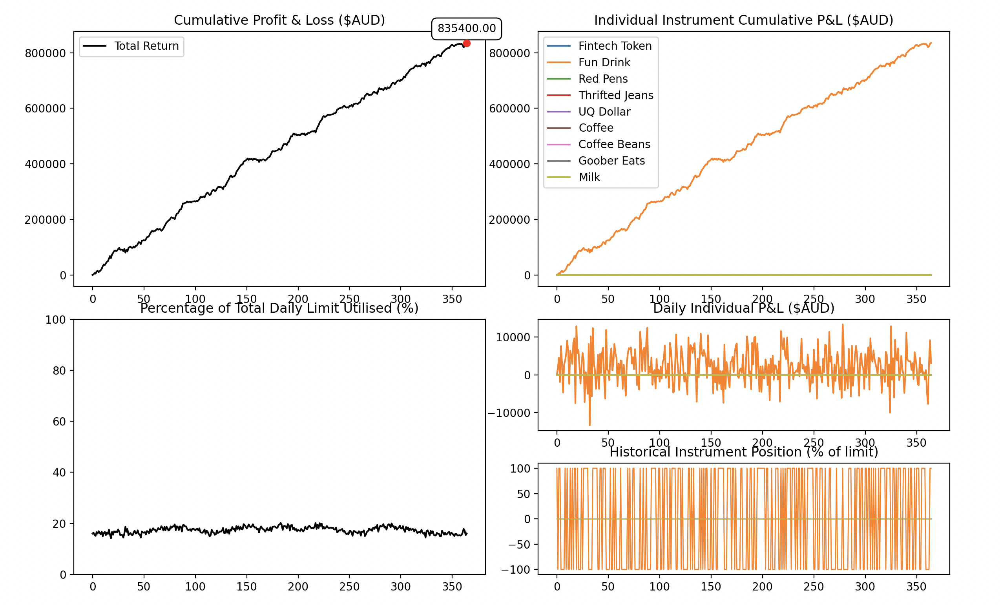

Including the buy on day 3, sell on day 4, we get:


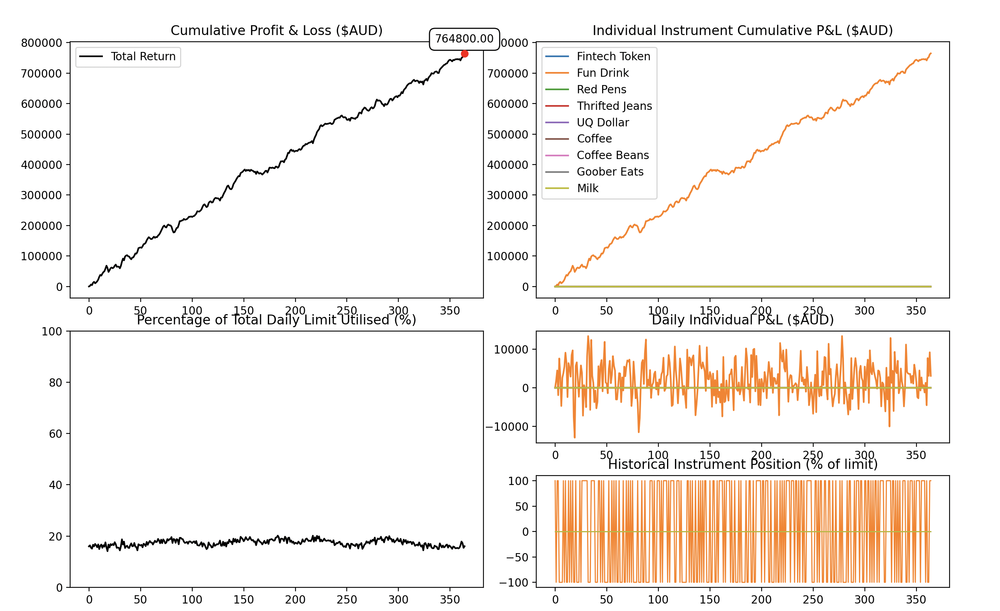

In [12]:
drink['Diff'] = drink['Price'].diff()
drink['AbsDiff'] = drink['Diff'].abs()
drink['CumAbsDiff'] = drink['AbsDiff'].cumsum()

# create a column so that for row x, if row x+1['AbsDiff'] is positive, row x['Buy'] is 1, otherwise -1
drink['Buy'] = drink['Diff'].shift(-1)
drink['Buy'] = drink['Buy'].apply(lambda x: 1 if x > 0 else -1)
drink['Buy'] = drink['Buy'].fillna(0)

drink['StockPosition'] = 10e3*drink['Buy']
drink['Transaction'] = drink['StockPosition'].diff()
drink['Transaction'] = drink['Transaction'].fillna(0 + drink['StockPosition'])

drink['CashFlow'] = -drink['Transaction'] * drink['Price']
drink['CashPos'] = drink['CashFlow'].cumsum()

drink['Theoretical Max PnL'] = drink['StockPosition'] * drink['Price'] + drink['CashPos']
# drink['PnL'] = drink['StockPosition'] * drink['Price'] 

drink

,Day,Price,EMA10,EMA5,EMA15,EMA20,LR,WeekAve,WeekVar,DayOfWeek,Diff,AbsDiff,CumAbsDiff,Buy,StockPosition,Transaction,CashFlow,CashPos,Theoretical Max PnL
0,0,8.00,8.000000,8.000000,8.000000,8.000000,NaN,NaN,NaN,0,NaN,NaN,NaN,1,10000.0,10000.0,-80000.0,-80000.0,0.0
1,1,8.19,8.034545,8.063333,8.023750,8.018095,NaN,NaN,NaN,1,0.19,0.19,0.19,-1,-10000.0,-20000.0,163800.0,83800.0,1900.0
2,2,7.74,7.980992,7.955556,7.988281,7.991610,NaN,NaN,NaN,2,-0.45,0.45,0.64,-1,-10000.0,0.0,-0.0,83800.0,6400.0
3,3,7.55,7.902630,7.820370,7.933496,7.949552,NaN,NaN,NaN,3,-0.19,0.19,0.83,1,10000.0,20000.0,-151000.0,-67200.0,8300.0
4,4,8.31,7.976697,7.983580,7.980559,7.983880,7.952,NaN,NaN,4,0.76,0.76,1.59,-1,-10000.0,-20000.0,166200.0,99000.0,15900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,360,8.17,7.831273,7.854513,7.851340,7.880144,8.087,7.765714,0.404286,3,0.45,0.45,147.97,1,10000.0,0.0,-0.0,1398000.0,1479700.0
361,361,8.94,8.032860,8.216342,7.987423,7.981083,8.938,7.914286,1.025714,4,0.77,0.77,148.74,-1,-10000.0,-20000.0,178800.0,1576800.0,1487400.0
362,362,8.63,8.141431,8.354228,8.067745,8.042885,9.200,8.057143,0.572857,5,-0.31,0.31,149.05,-1,-10000.0,0.0,-0.0,1576800.0,1490500.0
363,363,7.71,8.062989,8.139485,8.023027,8.011181,8.366,8.067143,-0.357143,6,-0.92,0.92,149.97,1,10000.0,20000.0,-154200.0,1422600.0,1499700.0


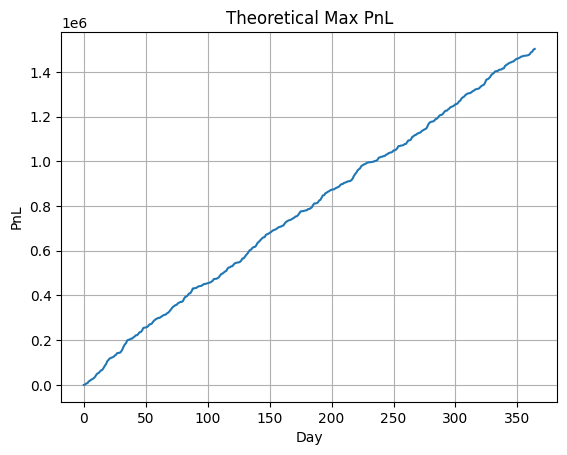

In [13]:
plt.plot(drink['Day'], drink['Theoretical Max PnL'])
plt.xlabel('Day')
plt.ylabel('PnL')
plt.title('Theoretical Max PnL')
plt.grid()




The above is the theoretical maximum Profit

Datasets loaded successfully.
Total PNL @ Day 0: 0
Total PNL @ Day 1: 1900.00
Total PNL @ Day 2: 6400.00
Total PNL @ Day 3: 4500.00
Total PNL @ Day 4: 12100.00
Total PNL @ Day 5: 15200.00
Total PNL @ Day 6: 10500.00
Total PNL @ Day 7: 13100.00
Total PNL @ Day 8: 16900.00
Total PNL @ Day 9: 22400.00
Total PNL @ Day 10: 31500.00
Total PNL @ Day 11: 37900.00
Total PNL @ Day 12: 35500.00
Total PNL @ Day 13: 41900.00
Total PNL @ Day 14: 47000.00
Total PNL @ Day 15: 49900.00
Total PNL @ Day 16: 58400.00
Total PNL @ Day 17: 68100.00
Total PNL @ Day 18: 60600.00
Total PNL @ Day 19: 73500.00
Total PNL @ Day 20: 79200.00
Total PNL @ Day 21: 85800.00
Total PNL @ Day 22: 88000.00
Total PNL @ Day 23: 85700.00
Total PNL @ Day 24: 87900.00
Total PNL @ Day 25: 93700.00
Total PNL @ Day 26: 97600.00
Total PNL @ Day 27: 90400.00
Total PNL @ Day 28: 91100.00
Total PNL @ Day 29: 90500.00
Total PNL @ Day 30: 85500.00
Total PNL @ Day 31: 93700.00
Total PNL @ Day 32: 80300.00
Total PNL @ Day 33: 90500.00
Tota

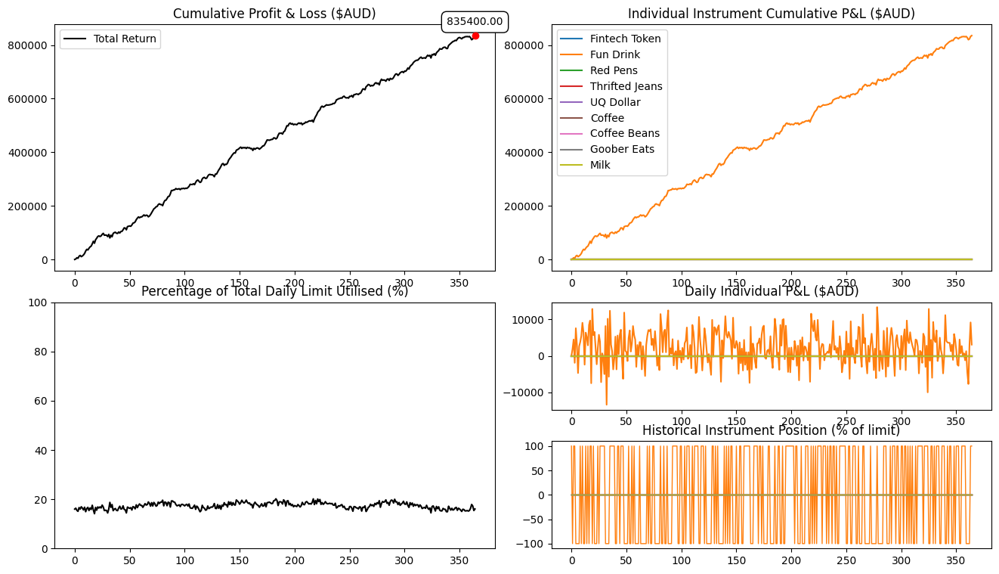

In [14]:
from simulation import TradingEngine, Algorithm, positionLimits

engine = TradingEngine()
algorithmInstance = Algorithm(engine.positions)
engine.run_algorithms(algorithmInstance)
engine.plot_returns()

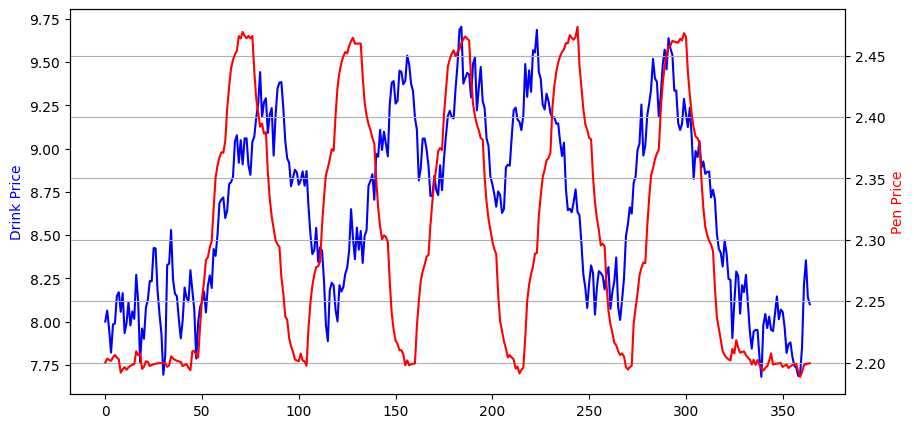

In [20]:
pens = pd.read_csv('/Users/jameshurst/Library/CloudStorage/SynologyDrive-james/Dropbox/Quant/AlgoJam2024/data/Red Pens_price_history.csv')

pens['EMA5'] = pens['Price'].ewm(span=5, adjust=False).mean()

# plot both EMA5 on same plot different y-axis
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 5)
ax1.plot(drink['Day'], drink['EMA5'], color='b')
ax1.set_ylabel('Drink Price', color='b')
ax2 = ax1.twinx()
ax2.plot(pens['Day'], pens['EMA5'], color='r')
ax2.set_ylabel('Pen Price', color='r')
plt.grid()



In [21]:
# find correlations between the two EMAs
correlation = drink['EMA5'].corr(pens['EMA5'])
correlation

0.47826139554545816

In [22]:
# find the correlation between pen price and drink price shifted by 10 days
correlation = drink['Price'].shift(10).corr(pens['Price'])
correlation

0.3099932532080801

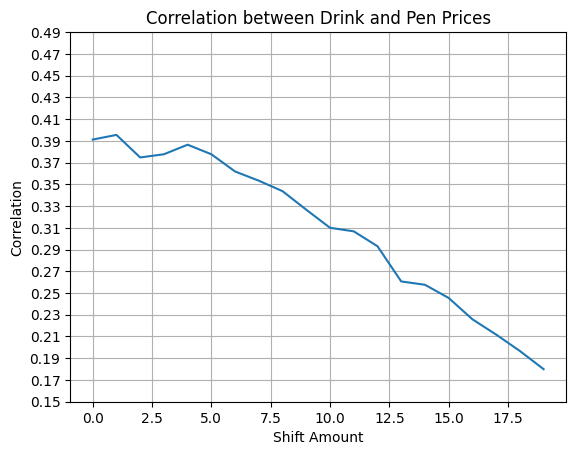

In [28]:
# loop through shift amounts and plot the correlation
correlations = []
for i in range(0, 20):
    correlation = drink['Price'].shift(i).corr(pens['Price'])
    correlations.append(correlation)

plt.plot(correlations)
plt.xlabel('Shift Amount')
plt.ylabel('Correlation')
plt.title('Correlation between Drink and Pen Prices')
plt.yticks(np.arange(0.15, 0.5, 0.02))
plt.grid()


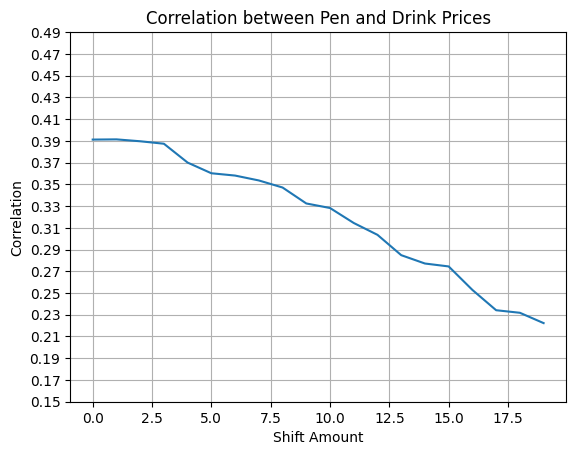

In [29]:
# find it the other way around
correlations2 = []
for i in range(0, 20):
    correlation = pens['Price'].shift(i).corr(drink['Price'])
    correlations2.append(correlation)

plt.plot(correlations2)
plt.xlabel('Shift Amount')
plt.ylabel('Correlation')
plt.title('Correlation between Pen and Drink Prices')
plt.yticks(np.arange(0.15, 0.5, 0.02))
plt.grid()


Doesn't seem to provide too much predictive value, but will experiment. However, going to sweep across rolling average sizes. The below shows the results:
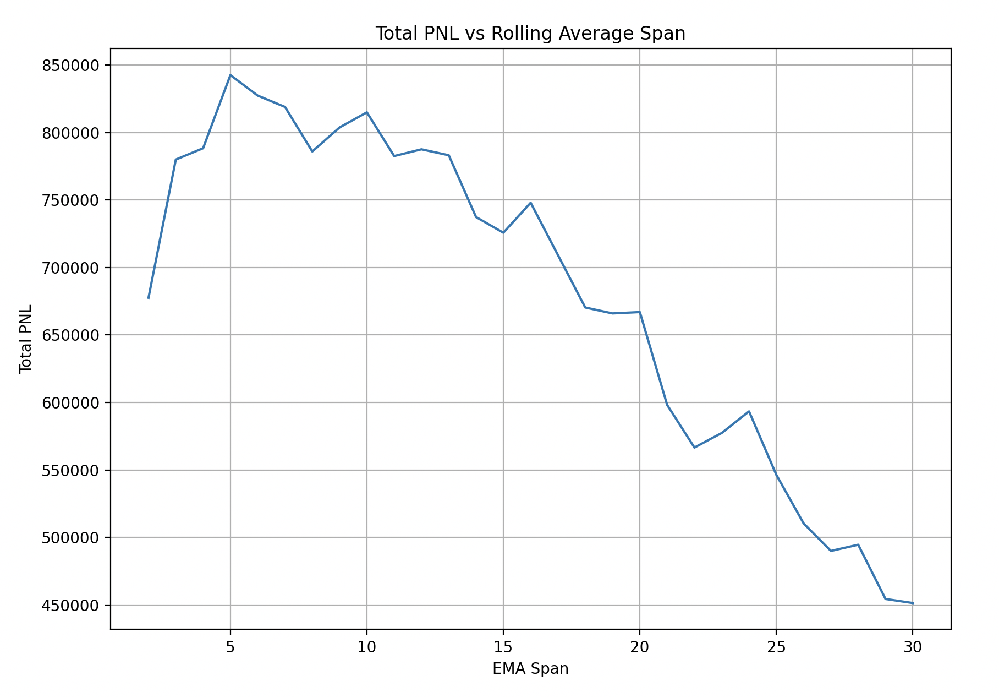

so rolling average span of 5 is clearly optimal. Now to check ema.

Checking for EMA
ignore title this is EMA
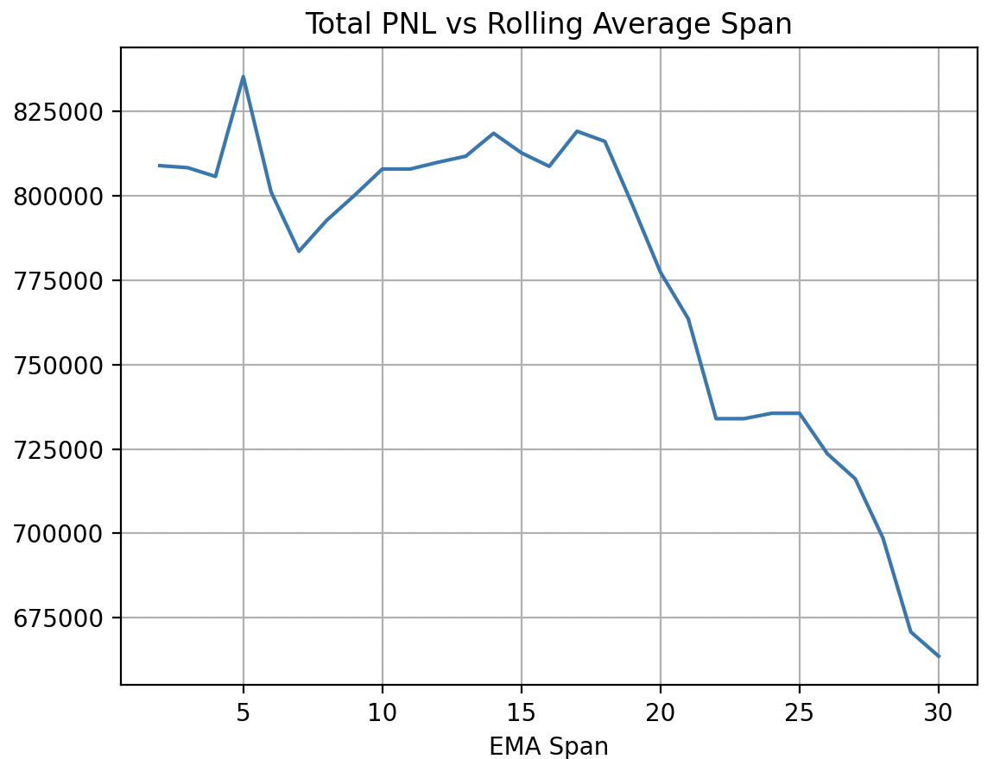

In [ ]:
drinks_df = pd.DataFrame(self.data["Fun Drink"])
pens_df = pd.DataFrame(self.data["Red Pens"])

drinks_df['EMA'] = drinks_df[0].ewm(5, adjust=False).mean()
price_drink = self.data['Fun Drink'][-1]
ema_drink = drinks_df['EMA'].iloc[-1]
theo = ema_drink + price_drink*self.var

Now I am going to sweep across just adding a scalar multiple of the pens price, because there is a correlation. The code is above. This is because there is a week correlation between the two variables. I'm sweeping between -10 and 10.
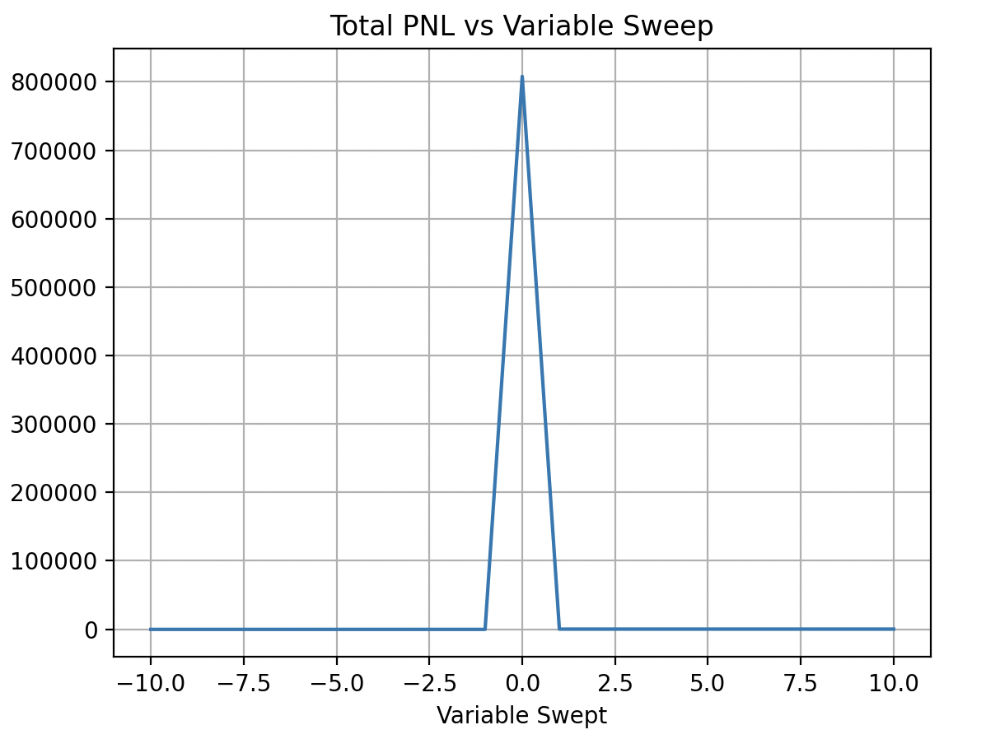


Obviously that didn't do very well, so I refined it
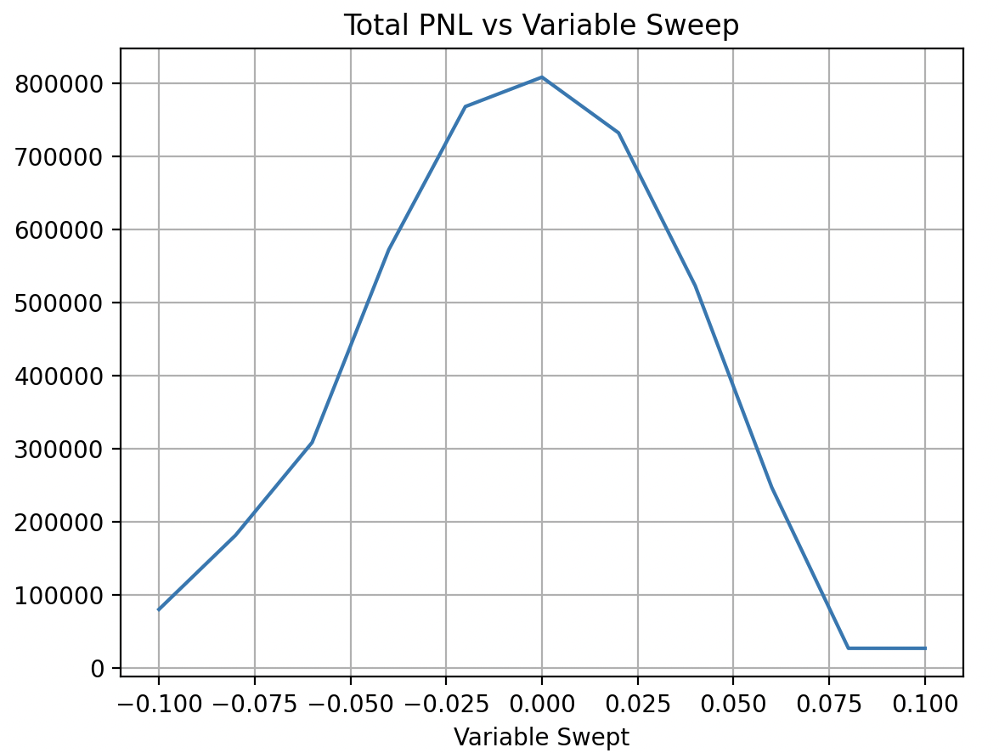
Still no benefit

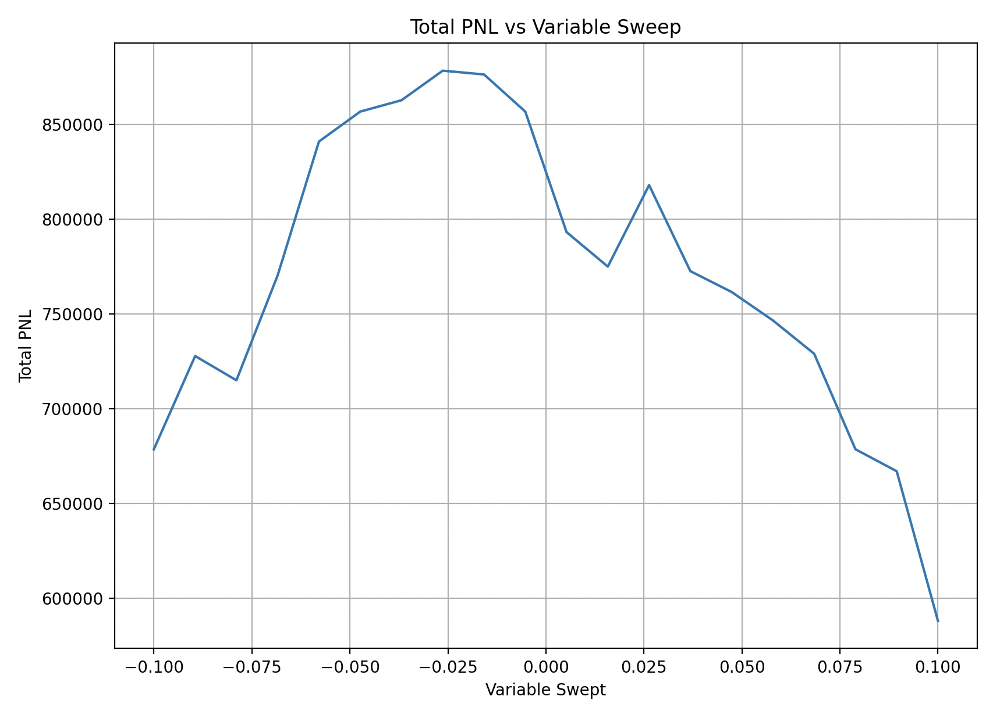

Now we have benefit lol. I think I was fucking up the ema somehow

Refining the search and adding a bit we get:
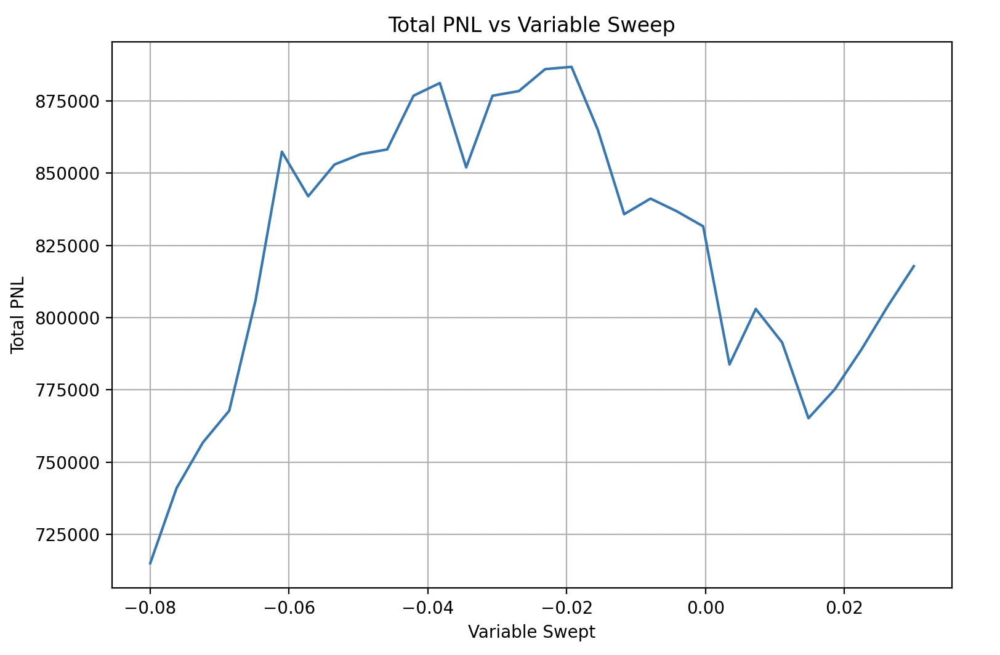

And another refinement: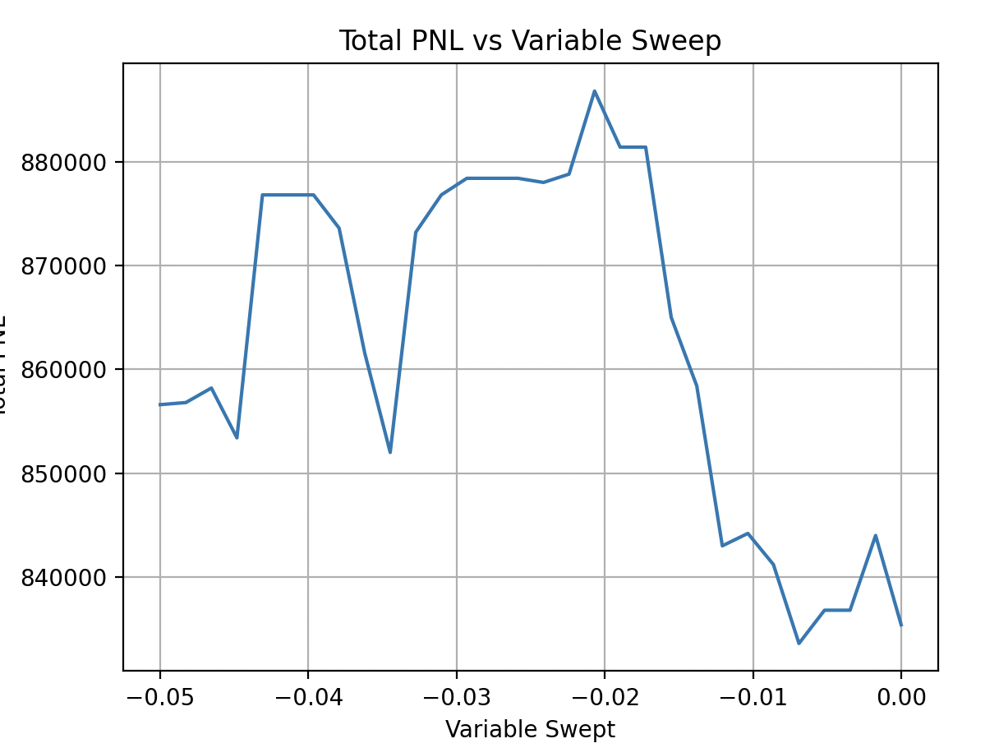

So will be adding -0.021 of the current price of Red pens. I expect this to be better with EMA of red pens.